In [1]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


In [2]:
import pandas as pd
import numpy as np
import os
import plotly.express as px
from scipy.signal import find_peaks
import matplotlib.pyplot as plt


In [3]:

folder_path = '/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MindGame/data/level_info'
all_dfs = []

for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)
        df["filename"] = file_name
        all_dfs.append(df)

combined_df = pd.concat(all_dfs, ignore_index=True)


ValueError: No objects to concatenate

In [ ]:
folder_path = '/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MindGame/data/level_info'
all_dfs = []

for file_name in os.listdir(folder_path):
    if file_name.endswith('.json'):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_json(file_path)
        df["filename"] = file_name
        all_dfs.append(df)

combined_df_level_info = pd.concat(all_dfs, ignore_index=True)

In [ ]:

combined_df_level_info['participant_id'] = combined_df_level_info['filename'].apply(get_participant_id)
combined_df_level_info['Level_info'] = combined_df_level_info['filename'].apply(get_levels)


In [ ]:
combined_df_level_info[combined_df_level_info["Level_info"] =="L1"]["participant_id"].value_counts()

In [4]:
combined_df_level_info[combined_df_level_info["Level_info"] =="L2"]["participant_id"].value_counts()

NameError: name 'combined_df_level_info' is not defined

In [5]:
combined_df_level_info[combined_df_level_info["Level_info"] =="L3"]["participant_id"].value_counts()

NameError: name 'combined_df_level_info' is not defined

In [6]:
# Function to split file name and get the character
def get_participant_id(file_name):
    print("Participnt ID: ",file_name.split('_')[1])
    return file_name.split('_')[1]

# Function to split file name and get the character
def get_levels(file_name):
    print("Levles: ",file_name.split('_')[2])
    return file_name.split('_')[2]

In [7]:
# Apply the function to each row and create a new column
combined_df['participant_id'] = combined_df['filename'].apply(split_and_get_character)
# Apply the function to each row and create a new column
combined_df['Level_info'] = combined_df['filename'].apply(get_levels)


NameError: name 'combined_df' is not defined

In [8]:
combined_df[combined_df["Level_info"] =="L1"]["participant_id"].value_counts()

NameError: name 'combined_df' is not defined

## Go/No-Go

In [9]:
df_go_no_go = pd.read_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MindGame/nogo_data.csv")


In [10]:
df_go_no_go

,Unnamed: 0,type,clicked,correct,start_ts,end_ts,ttc,ID,Group
0,0,circle,False,1,10:24:44:693,10:24:45:699,1.006,N1,N
1,1,circle,False,1,10:24:48:508,10:24:49:511,1.003,N1,N
2,2,square,True,1,10:24:52:315,10:24:52:787,0.472,N1,N
3,3,square,True,1,10:24:55:588,10:24:56:059,0.471,N1,N
4,4,square,True,1,10:24:58:872,10:24:59:317,0.445,N1,N
...,...,...,...,...,...,...,...,...,...
715,715,circle,False,1,13:37:28:245,13:37:29:247,1.002,P2,P
716,716,circle,False,1,13:37:32:049,13:37:33:051,1.002,P2,P
717,717,circle,False,1,13:37:35:853,13:37:36:855,1.002,P2,P
718,718,circle,False,1,13:37:39:657,13:37:40:658,1.001,P2,P


In [11]:

for i in df_go_no_go["ID"].unique():
    print("Participant ID: ============================================================", i)
    pid_df = df_go_no_go[df_go_no_go["ID"]==i]
    pid_df_circle = pid_df[pid_df["type"]=="circle"] # No Go task
    pid_df_square = pid_df[pid_df["type"]=="square"] # Go task

    go_correct = pid_df_circle["correct"].value_counts()
    no_go_correct = pid_df_square["correct"].value_counts()
    print("pid_df_circle ttc: ",pid_df_circle["ttc"].mean())
    print("pid_df_square ttc: ",pid_df_square["ttc"].mean())
    print("go_correct: \n",go_correct,"Total Number of Go tasks: ",  pid_df_circle["correct"].shape[0])
    print("no_go_correct: \n",no_go_correct,"Total number of no go tasks",pid_df_square["correct"].shape[0])

Participant ID: ============================================================ N1
pid_df_circle ttc:  1.0088777777777778
pid_df_square ttc:  0.5083888888888889
go_correct: 
 correct
1    90
Name: count, dtype: int64 Total Number of Go tasks:  90
no_go_correct: 
 correct
1    90
Name: count, dtype: int64 Total number of no go tasks 90
Participant ID: ============================================================ N2
pid_df_circle ttc:  0.9936956521739131
pid_df_square ttc:  0.5321818181818182
go_correct: 
 correct
1    89
0     3
Name: count, dtype: int64 Total Number of Go tasks:  92
no_go_correct: 
 correct
1    85
0     3
Name: count, dtype: int64 Total number of no go tasks 88
Participant ID: ============================================================ P1
pid_df_circle ttc:  1.0084252873563218
pid_df_square ttc:  0.5102903225806452
go_correct: 
 correct
1    87
Name: count, dtype: int64 Total Number of Go tasks:  87
no_go_correct: 
 correct
1    93
Name: count, dtype: int64 Total number 

In [12]:

folder_path = '/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MindGame/data/intake'
all_dfs = []

for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)
        df["filename"] = file_name
        all_dfs.append(df)

combined_df_medication = pd.concat(all_dfs, ignore_index=True)


In [13]:
combined_df_medication

,userID,medication,time,filename
0,P1,Adderall,08:00,intake_P1.csv
1,P2,NaN,01:23,intake_P2.csv
2,P100,Focalin,22:16,intake_P100.csv
3,P1003,Ritalin,11:14,intake_P1003.csv


In [14]:

folder_path = '/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MindGame/data/mouse_data'
all_dfs = []
filename_list = []
for file_name in os.listdir(folder_path):
    print("file_name: ",file_name )
    filename_list.append(file_name)
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)
        df["filename"] = file_name
        all_dfs.append(df)

combined_mouse_df = pd.concat(all_dfs, ignore_index=True)


file_name:  mouse_N1_L3_S1_1713314121.csv
file_name:  mouse_P1_L3_S1_1713193005.csv
file_name:  mouse_N1_L1_S1_1712779648.csv
file_name:  mouse_N1_L3_S2_1713315843.csv
file_name:  mouse_N1_L2_S1_1713221406.csv
file_name:  mouse_P1_L2_S2_1713404666.csv
file_name:  mouse_P100_L3_S2_1713217298.csv
file_name:  mouse_P1_L3_S1_1712941417.csv
file_name:  mouse_P1_L1_S1_1713192971.csv
file_name:  mouse_P1_L1_S1_1713193138.csv
file_name:  mouse_N1_L3_S2_1712779717.csv
file_name:  mouse_N1_L2_S1_1713314848.csv
file_name:  mouse_P100_L2_S2_1713219117.csv
file_name:  mouse_P1_L2_S2_1713193072.csv
file_name:  mouse_P100_L3_S1_1712715454.csv
file_name:  mouse_P100_L2_S2_1712715424.csv
file_name:  mouse_P2_L2_S3_1712943726.csv
file_name:  mouse_P1_L2_S3_1712941403.csv
file_name:  mouse_P100_L3_S2_1713219148.csv
file_name:  mouse_N1_L2_S3_1713223770.csv
file_name:  mouse_N1_L2_S2_1713315826.csv
file_name:  mouse_P100_L3_S1_1713219473.csv
file_name:  mouse_P100_L1_S2_1713216557.csv
file_name:  mouse_N1

In [15]:
df_mouse = pd.DataFrame(filename_list, columns=['Mouse_Data_filename'])

In [16]:
# Function to split file name and get the character
def get_participant_id(file_name):
    print("Participnt ID: ",file_name.split('_')[1])
    return file_name.split('_')[1]
    
def get_level_id(file_name):
    print("Participnt ID: ",file_name.split('_')[2])
    return file_name.split('_')[2]
    
def get_session_id(file_name):
    print("Participnt ID: ",file_name.split('_')[3])
    return file_name.split('_')[3]
    
df_mouse

,Mouse_Data_filename
0,mouse_N1_L3_S1_1713314121.csv
1,mouse_P1_L3_S1_1713193005.csv
2,mouse_N1_L1_S1_1712779648.csv
3,mouse_N1_L3_S2_1713315843.csv
4,mouse_N1_L2_S1_1713221406.csv
...,...
75,mouse_N1_L1_S2_1713223755.csv
76,mouse_N1_L2_S3_1713223126.csv
77,mouse_P1_L3_S2_1713193296.csv
78,mouse_P1_L2_S1_1713193351.csv


In [17]:
# Apply the function to each row and create a new column
df_mouse['participant_id'] = df_mouse['Mouse_Data_filename'].apply(get_participant_id)
# Apply the function to each row and create a new column
df_mouse['Level_id'] = df_mouse['Mouse_Data_filename'].apply(get_level_id)
df_mouse['session_id'] = df_mouse['Mouse_Data_filename'].apply(get_session_id)



Participnt ID:  N1
Participnt ID:  P1
Participnt ID:  N1
Participnt ID:  N1
Participnt ID:  N1
Participnt ID:  P1
Participnt ID:  P100
Participnt ID:  P1
Participnt ID:  P1
Participnt ID:  P1
Participnt ID:  N1
Participnt ID:  N1
Participnt ID:  P100
Participnt ID:  P1
Participnt ID:  P100
Participnt ID:  P100
Participnt ID:  P2
Participnt ID:  P1
Participnt ID:  P100
Participnt ID:  N1
Participnt ID:  N1
Participnt ID:  P100
Participnt ID:  P100
Participnt ID:  N1
Participnt ID:  N1
Participnt ID:  N1
Participnt ID:  N1
Participnt ID:  P1
Participnt ID:  P1
Participnt ID:  P100
Participnt ID:  P1
Participnt ID:  P1
Participnt ID:  N1
Participnt ID:  N1
Participnt ID:  P100
Participnt ID:  P100
Participnt ID:  P100
Participnt ID:  P1
Participnt ID:  P1
Participnt ID:  P100
Participnt ID:  P1
Participnt ID:  P100
Participnt ID:  P1
Participnt ID:  N1
Participnt ID:  P1
Participnt ID:  N1
Participnt ID:  P1
Participnt ID:  P1
Participnt ID:  P1
Participnt ID:  P1
Participnt ID:  P1
Parti

In [18]:
for i in df_mouse["participant_id"].unique():
    print("pid== ",i)
    print("df_mouse: ",df_mouse[df_mouse["participant_id"]==i]["Level_id"].value_counts())
    

pid==  N1
df_mouse:  Level_id
L3    9
L1    9
L2    9
Name: count, dtype: int64
pid==  P1
df_mouse:  Level_id
L3    11
L2    11
L1    10
Name: count, dtype: int64
pid==  P100
df_mouse:  Level_id
L3    6
L2    6
L1    6
Name: count, dtype: int64
pid==  P2
df_mouse:  Level_id
L2    1
L3    1
L1    1
Name: count, dtype: int64


In [19]:
df_mouse["participant_id"].unique()

array(['N1', 'P1', 'P100', 'P2'], dtype=object)

In [20]:
df_mouse

,Mouse_Data_filename,participant_id,Level_id,session_id
0,mouse_N1_L3_S1_1713314121.csv,N1,L3,S1
1,mouse_P1_L3_S1_1713193005.csv,P1,L3,S1
2,mouse_N1_L1_S1_1712779648.csv,N1,L1,S1
3,mouse_N1_L3_S2_1713315843.csv,N1,L3,S2
4,mouse_N1_L2_S1_1713221406.csv,N1,L2,S1
...,...,...,...,...
75,mouse_N1_L1_S2_1713223755.csv,N1,L1,S2
76,mouse_N1_L2_S3_1713223126.csv,N1,L2,S3
77,mouse_P1_L3_S2_1713193296.csv,P1,L3,S2
78,mouse_P1_L2_S1_1713193351.csv,P1,L2,S1


In [21]:
df_ttc = pd.read_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MindGame/nogo_data.csv")


In [32]:
df_ttc[df_ttc["ID"]=="N1"]["ttc"].std()

0.25546554939438365

In [23]:

# Calculating mean and standard deviation by group
result = df_ttc.groupby('ID')['ttc'].agg(['mean', 'std'])

print(result)

        mean       std
ID                    
N1  0.758633  0.255466
N2  0.768067  0.255204
P1  0.751056  0.257508
P2  0.819283  0.210750


In [36]:
result.to_csv("~/Desktop/go_no_go.csv")

In [26]:
df_ttc.columns

Index(['Unnamed: 0', 'type', 'clicked', 'correct', 'start_ts', 'end_ts', 'ttc',
       'ID', 'Group'],
      dtype='object')

In [33]:
result_ttc = df_ttc.groupby('type')['ttc'].agg(['mean', 'std'])


In [51]:
# result_ttc

In [4]:
df_percentage_change = pd.read_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MindGame/mindgame_level_percentchange.csv")
df_percentage_change

,Unnamed: 0,Type,UserID,Level,Sublevel,Timestamp,Date,Day,Percent_Change,Average_X_Acceleration,Average_Y_Acceleration,Max_X_Acceleration,Max_Y_Acceleration
0,131,user,N1,1,1,1712759963,2024-04-10 10:39:23,Wednesday,0.532908,765.754386,414.350877,6003.0,3369.0
1,132,user,N1,1,1,1712779648,2024-04-10 16:07:28,Wednesday,10.779491,1062.795455,411.136364,6686.0,3202.0
2,133,user,N1,1,1,1713314085,2024-04-16 20:34:45,Tuesday,1.756740,1150.822222,538.222222,8550.0,5489.0
3,134,user,N1,1,1,1713314836,2024-04-16 20:47:16,Tuesday,30.240524,719.822222,448.044444,5640.0,3244.0
4,135,user,N1,1,2,1713221385,2024-04-15 18:49:45,Monday,6.921202,841.943396,350.924528,4912.0,2620.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,257,user,P1,3,3,1713193366,2024-04-15 11:02:46,Monday,16.729125,898.666667,568.871795,7120.0,3084.0
109,258,user,P1,3,3,1713404556,2024-04-17 21:42:36,Wednesday,16.412602,616.345794,455.682243,4988.0,2552.0
110,259,user,P2,1,2,1712943639,2024-04-12 13:40:39,Friday,91.129385,304.223214,200.080357,3961.0,3605.0
111,260,user,P2,2,3,1712943726,2024-04-12 13:42:06,Friday,2.440493,575.572917,365.572917,8235.0,2639.0


In [6]:

for i in df_percentage_change["UserID"].unique():
    print("PID ====================================================================",i)
    pid_df = df_percentage_change[df_percentage_change["UserID"]==i]
    print("Level 1")
    print("Shape for df sizes: ",pid_df[pid_df["Level"]==1].shape)
    

PID ==================================================================== N1
Level 1
Shape for df sizes:  (9, 13)
PID ==================================================================== N2
Level 1
Shape for df sizes:  (17, 13)
PID ==================================================================== P1
Level 1
Shape for df sizes:  (10, 13)
PID ==================================================================== P2
Level 1
Shape for df sizes:  (1, 13)


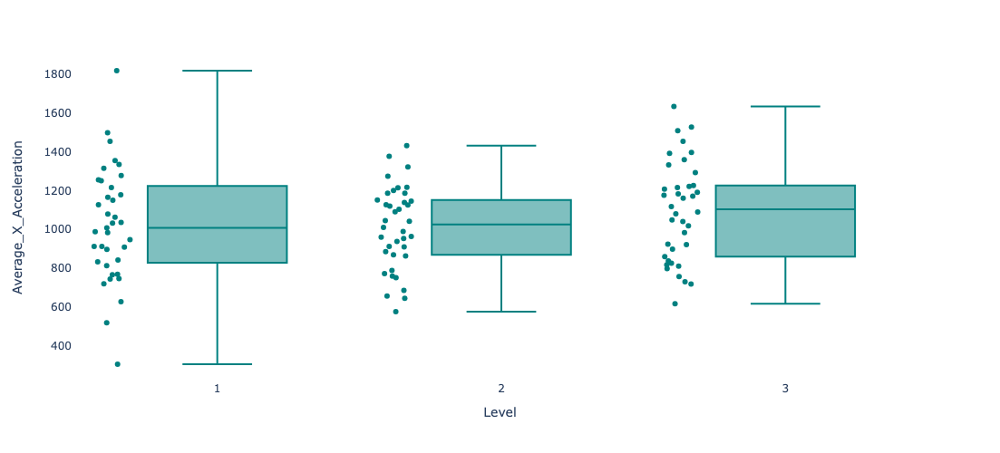

In [7]:
fig = px.box(df_percentage_change, x="Level", y="Average_X_Acceleration", points="all")
fig.update_layout(height=500,width=800)  # Specify the height in pixels.
fig.update_layout(plot_bgcolor='white')
fig.update_traces(marker_color='teal')  # Change 'blue' to any desired color
fig.show()

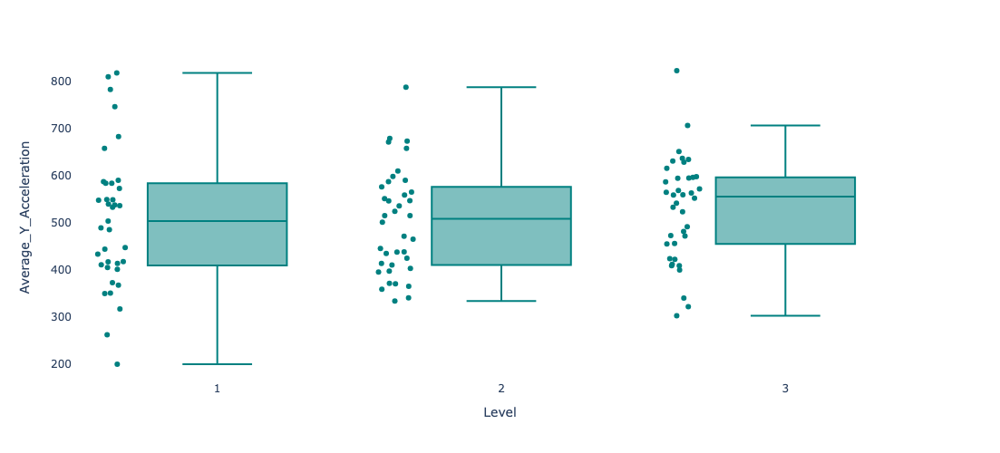

In [8]:
fig = px.box(df_percentage_change, x="Level", y="Average_Y_Acceleration", points="all")
fig.update_layout(height=500,width=800)  # Specify the height in pixels.
fig.update_traces(marker_color='teal')  # Change 'blue' to any desired color
fig.update_layout(plot_bgcolor='white')
fig.show()

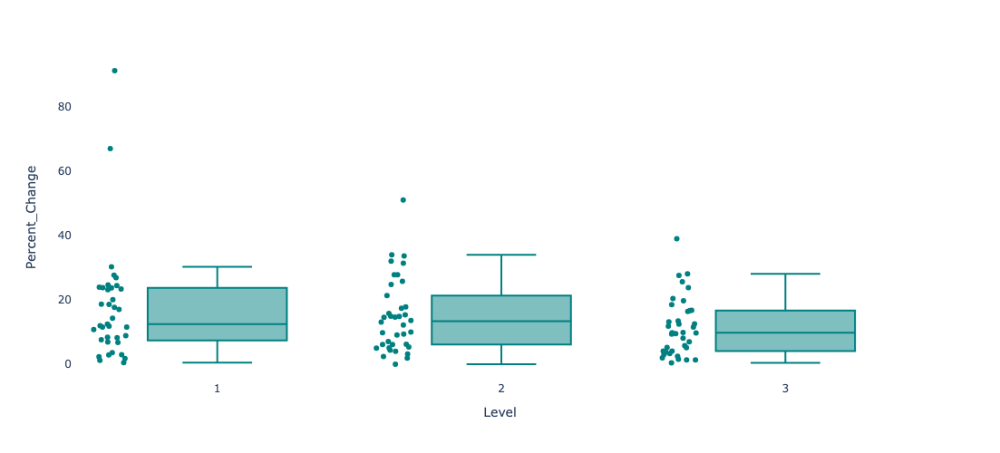

In [9]:
fig = px.box(df_percentage_change, x="Level", y="Percent_Change", points="all")
fig.update_layout(height=500,width=800)  # Specify the height in pixels.
fig.update_traces(marker_color='teal')  # Change 'blue' to any desired color
fig.update_layout(plot_bgcolor='white')
fig.show()

In [10]:
# df_percentage_change["UserID"]

In [11]:
level1 = df_percentage_change[df_percentage_change["Level"]==1]
level2 = df_percentage_change[df_percentage_change["Level"]==2]
level3 = df_percentage_change[df_percentage_change["Level"]==3]

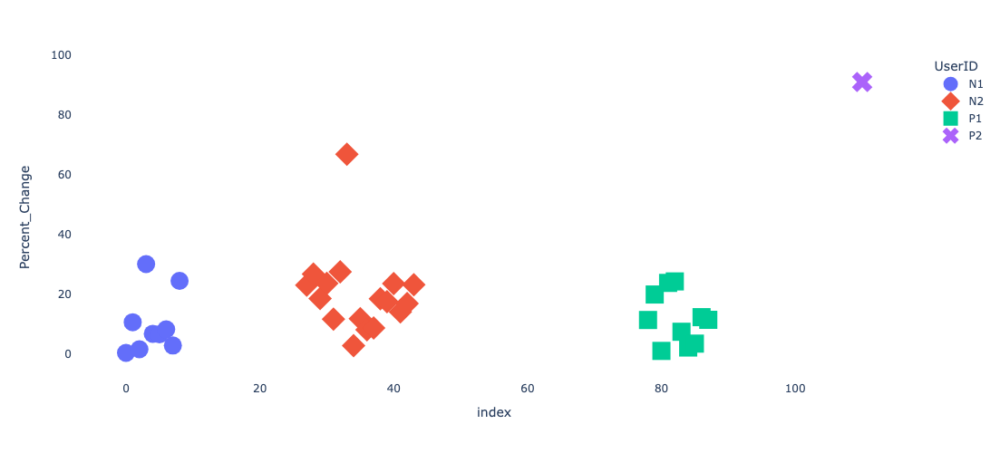

In [12]:
fig = px.scatter(level1,y="Percent_Change", color="UserID", symbol="UserID")
# Set marker size and color
fig.update_traces(marker=dict(size=20))  # Customize marker size
fig.update_layout(height=500,width=800)  # Specify the height in pixels
fig.update_layout(plot_bgcolor='white')
fig.show()

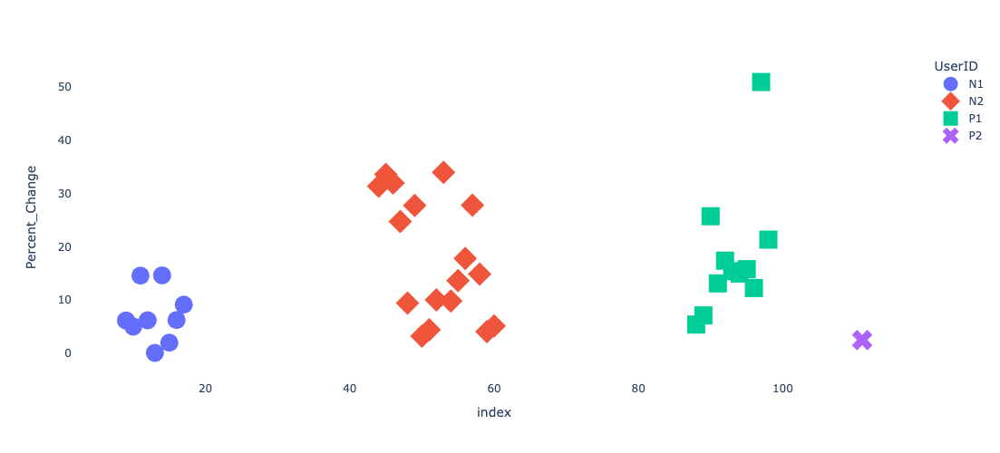

In [13]:
fig = px.scatter(level2, y="Percent_Change", color="UserID", symbol="UserID")
# Set marker size and color
fig.update_traces(marker=dict(size=20))  # Customize marker size
fig.update_layout(height=500,width=800)  # Specify the height in pixels
fig.update_layout(plot_bgcolor='white')
fig.show()

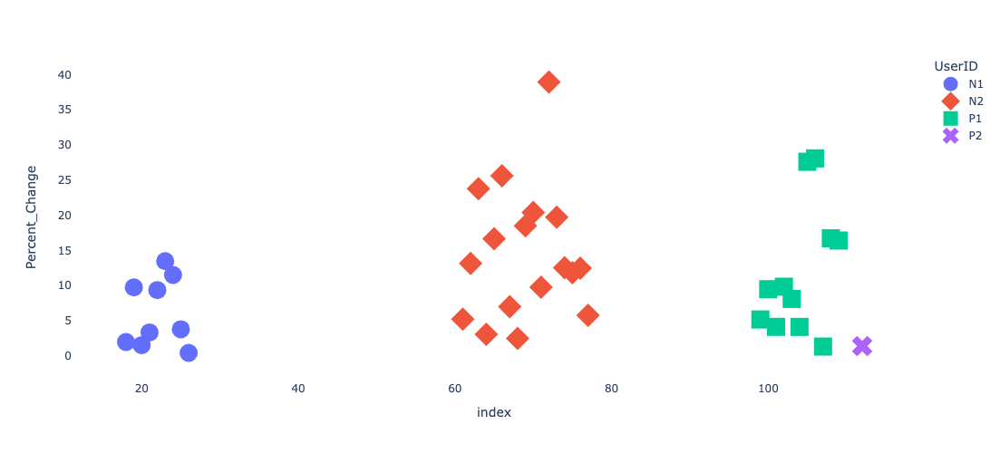

In [34]:
fig = px.scatter(level3, y="Percent_Change", color="UserID", symbol="UserID")
# Set marker size and color.
fig.update_traces(marker=dict(size=20))  # Customize marker size
fig.update_layout(height=500,width=800)  # Specify the height in pixels
fig.update_layout(plot_bgcolor='white')
fig.show()

In [16]:
df_fsr = pd.read_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MedDock/Results/first_sensor_data_20240516-153729.csv")


In [17]:
df_fsr

,FSR,Time,Date,Milli
0,49,15,16/05/2024,14189
1,49,15,16/05/2024,14189
2,49,15,16/05/2024,14445
3,49,15,16/05/2024,14189
4,49,15,16/05/2024,14445
...,...,...,...,...
5638311,27,15,16/05/2024,442743
5638312,27,15,16/05/2024,442774
5638313,27,15,16/05/2024,442805
5638314,25,15,16/05/2024,442836


In [14]:
# fig = px.line(df_fsr[:10000], y="FSR", title='Life expectancy in Canada')
# fig.show()

In [15]:
# peaks, _ = find_peaks(df_fsr["FSR"], height=0)
# plt.plot(df_fsr["FSR"])
# plt.plot(peaks, df_fsr["FSR"][peaks], "x")
# plt.plot(np.zeros_like(df_fsr["FSR"]), "--", color="gray")
# plt.show()

## Mouse acceleration calcualtion

In [4]:
import os
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Directory and file handling
DATA_DIRECTORY = "mouse_data/"
FILENAME_EXT = "csv"
filename_pattern = re.compile(r"([NP]\d+)_L(\d+)_S(\d+)_([0-9]+)\.csv")

# Function to classify user type
def classify_user(user_id):
    if user_id.startswith('N'):
        return 'Neurotypical'
    elif user_id.startswith('P'):
        return 'Neurodivergent'
    else:
        return 'Unknown'

# Dictionary to store data for each user
user_data = {}

# Read and process each file
for filename in os.listdir(DATA_DIRECTORY):
    if filename.endswith(FILENAME_EXT):
        match = filename_pattern.search(filename)
        if match:
            user_id, level, sublevel, epoch = match.groups()
            path = os.path.join(DATA_DIRECTORY, filename)
            df = pd.read_csv(path)
            
            # Ensure numerical columns are correctly formatted
            df['x(px/s^2)'] = pd.to_numeric(df['x(px/s^2)'], errors='coerce')
            df['y(px/s^2)'] = pd.to_numeric(df['y(px/s^2)'], errors='coerce')
            
            if user_id not in user_data:
                user_data[user_id] = df
            else:
                user_data[user_id] = pd.concat([user_data[user_id], df])

# Calculate metrics for each user
user_metrics = {}



for user_id, data in user_data.items():
    data['x(px/s^2)'] = data['x(px/s^2)'].abs()
    data['y(px/s^2)'] = data['y(px/s^2)'].abs()
    metrics = {
        'mean_x_accel': data['x(px/s^2)'].mean(),
        'std_x_accel': data['x(px/s^2)'].std(),
        'max_x_accel': data['x(px/s^2)'].max(),
        # 'min_x_accel': data['x(px/s^2)'].min(),
        'mean_y_accel': data['y(px/s^2)'].mean(),
        'std_y_accel': data['y(px/s^2)'].std(),
        'max_y_accel': data['y(px/s^2)'].max(),
        # 'min_y_accel': data['y(px/s^2)'].min()
    }
    user_metrics[user_id] = metrics

# Convert metrics to DataFrame
metrics_df = pd.DataFrame.from_dict(user_metrics, orient='index')
# metrics_df.abs()

# Add user type to DataFrame
metrics_df['user_type'] = [classify_user(user_id) for user_id in metrics_df.index]

# Split data by user type
neurotypical_df = metrics_df[metrics_df['user_type'] == 'Neurotypical']
neurodivergent_df = metrics_df[metrics_df['user_type'] == 'Neurodivergent']

FileNotFoundError: [Errno 2] No such file or directory: 'mouse_data/'

## Mouse data plots

/var/folders/d3/mwqwbw3x0b30c22zykpzcrww0000gn/T/ipykernel_72687/442802236.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'NOSHAPE' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  data.fillna("NOSHAPE", inplace=True)
/var/folders/d3/mwqwbw3x0b30c22zykpzcrww0000gn/T/ipykernel_72687/442802236.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'NOSHAPE' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  data.fillna("NOSHAPE", inplace=True)
/var/folders/d3/mwqwbw3x0b30c22zykpzcrww0000gn/T/ipykernel_72687/442802236.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'NOSHAPE' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  data.fillna("NOSHAPE", inp

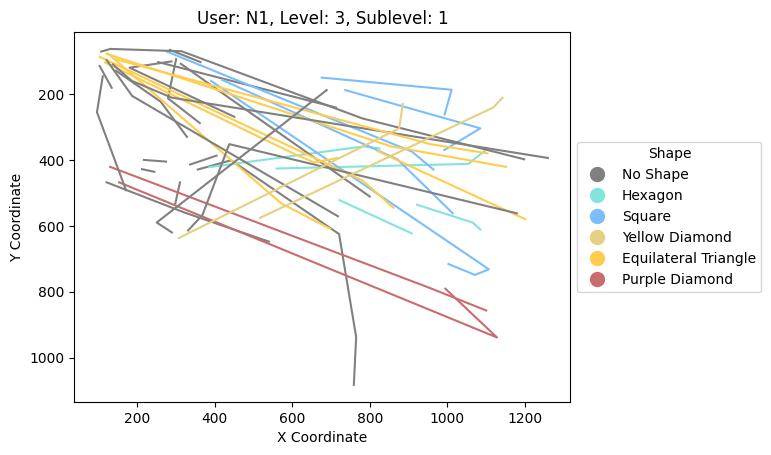

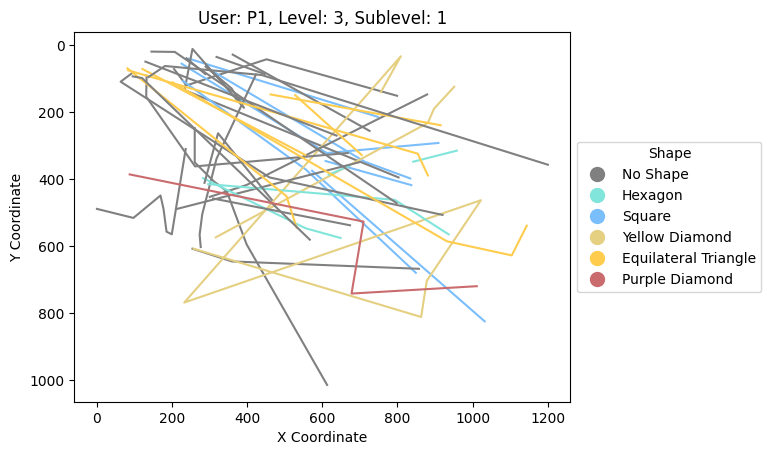

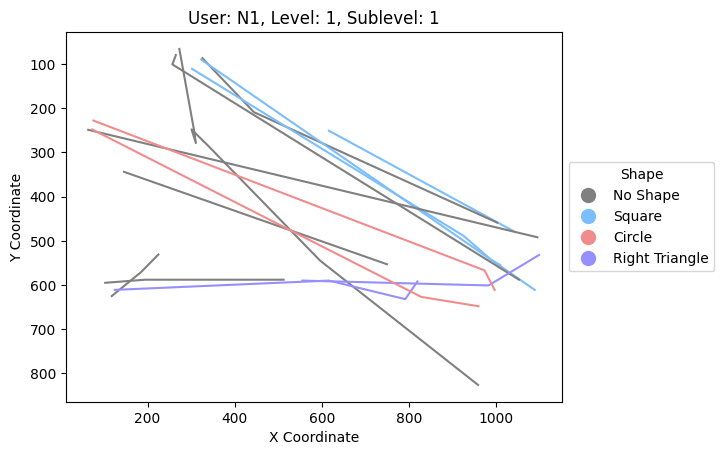

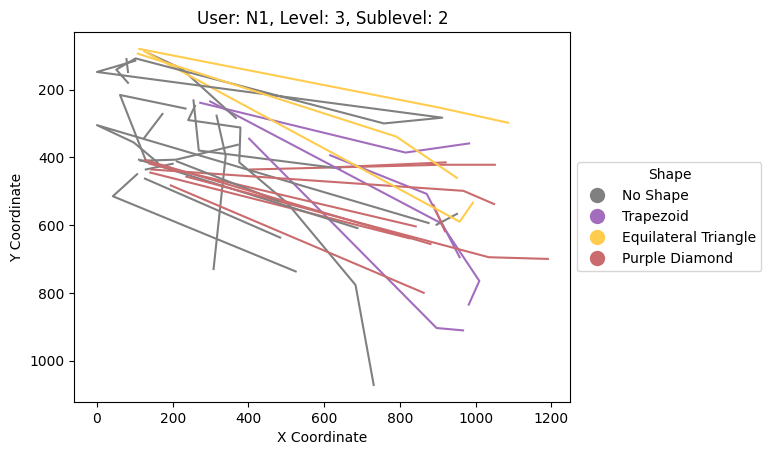

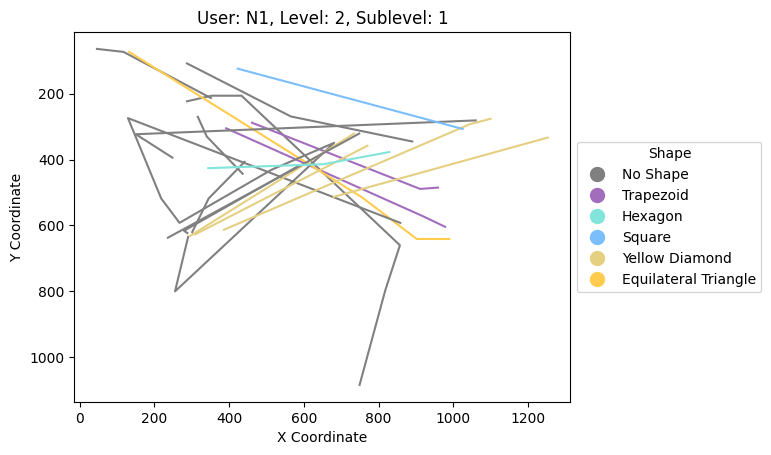

...

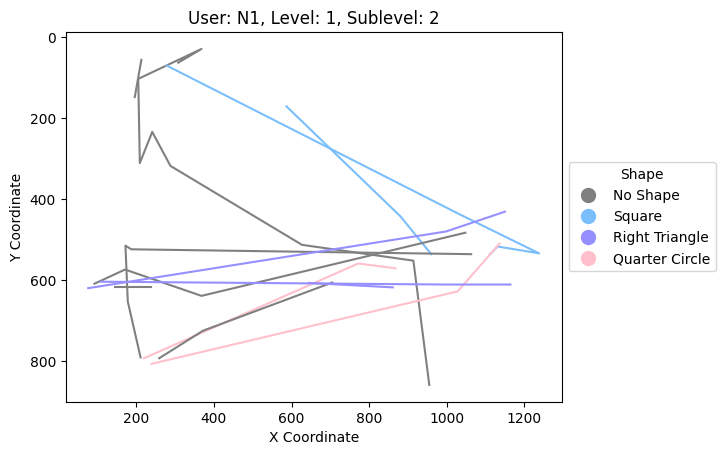

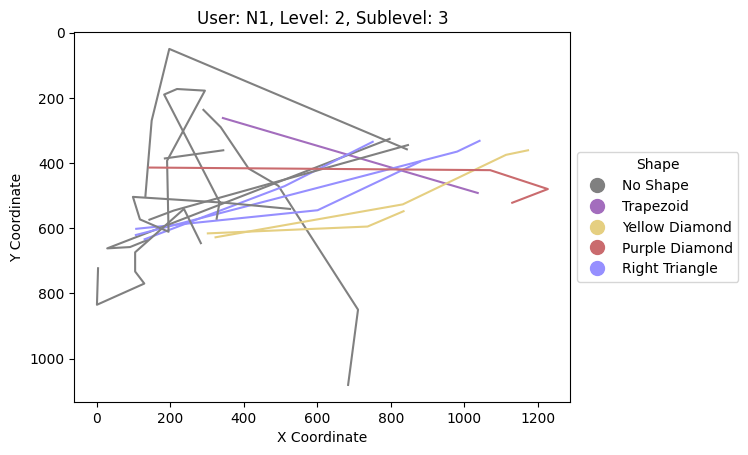

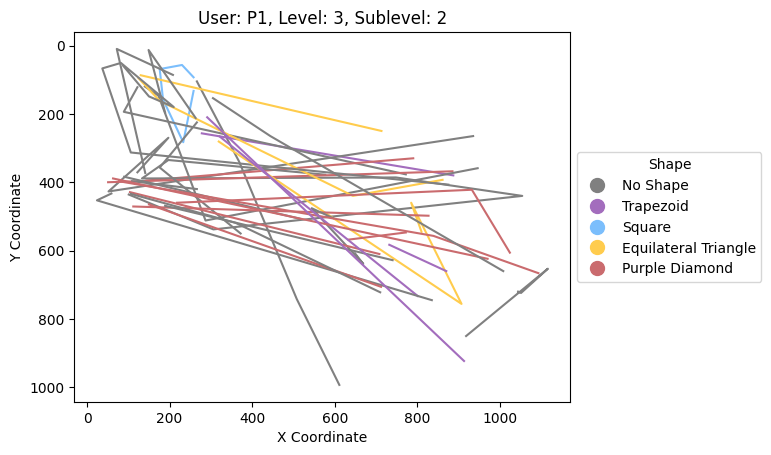

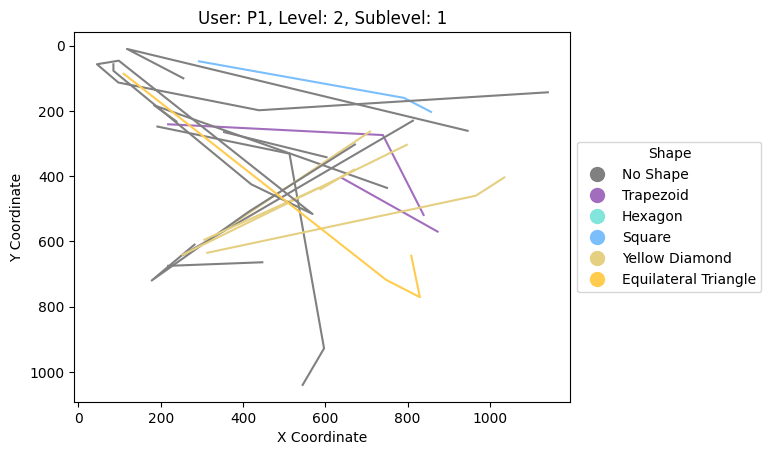

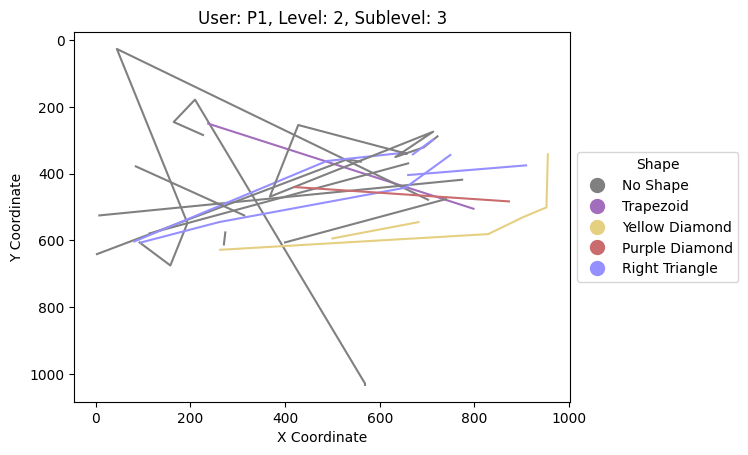

In [9]:
# Directory and file handling
DATA_DIRECTORY = "/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/BSN_2024/MindGame/data/mouse_data"
FILENAME_EXT = "csv"
filename_pattern = re.compile(r"([NP]\d+)_L(\d+)_S(\d+)_([0-9]+)\.csv")

for filename in os.listdir(DATA_DIRECTORY):
    if filename.endswith(FILENAME_EXT):
        match = filename_pattern.search(filename)
        if match:
            user_id, level, sublevel, epoch = match.groups()
            path = os.path.join(DATA_DIRECTORY, filename)
            df = pd.read_csv(path)
            plot_mouse_movements(df, user_id, level, sublevel)


In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import re

In [7]:


def plot_mouse_movements(data, user_id, level, sublevel):
    # Prepare colors for each shape, adding a default color for null or any unspecified shape
    color_map = {
        'No Shape': 'gray',
        'Trapezoid': '#A36DBD',
        'Hexagon': '#81E5DB',
        'Square': '#7BBEFC',
        'Yellow Diamond': '#E5CF81',
        'Equilateral Triangle': '#FFCC4D',
        'Purple Diamond': '#CA6B6E',
        'Circle': "#F08C8C",
        'Right Triangle': "#968FFF",
        "Quarter Circle": "pink"
    }

    data['color'] = data['shape'].apply(lambda x: color_map.get(x, 'gray'))
    data.fillna("NOSHAPE", inplace=True)

    fig, ax = plt.subplots()

    segment_x, segment_y, segment_colors = [], [], []
    last_shape = None
    used_shapes = set()  

    for index, row in data.iterrows():
        
        # Once we accumulated all data from one movement we plot it
        if row['shape'] == 'END_OF_STROKE' or (last_shape == "NOSHAPE" and row['shape'] != 'NOSHAPE'):
            if segment_x and segment_y:
                ax.plot(segment_x, segment_y, color=segment_colors[0])  
                used_shapes.add(segment_colors[0])  
            segment_x, segment_y, segment_colors = [], [], []
        
        # Keep adding the x and y values
        if row['shape'] != 'END_OF_STROKE':
            segment_x.append(row['x'])
            segment_y.append(row['y'])
            segment_colors.append(row['color'])
            last_shape = row['shape']

    if segment_x and segment_y:
        ax.plot(segment_x, segment_y, color=segment_colors[0])
        used_shapes.add(segment_colors[0])

    ax.invert_yaxis()
    handles = [
        plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10, label=shape)
        for shape, color in color_map.items() if color in used_shapes
    ]
    ax.legend(handles=handles, title="Shape", loc='center left', bbox_to_anchor=(1, 0.5))

    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_title(f'User: {user_id}, Level: {level}, Sublevel: {sublevel}')

    return ax